# Task
1. Train at least two advanced models on the energy dataset from TSA_Example notebook. You may choose to use only the last 5 years of the dataset to reduce data size
2. Explain the patterns the model has learned using SHAP local and global plots
3. Explain the patterns using LIME
4. Compare the answers from LIME & SHAP (global & some local) – what do you see? Is it the same?

In [9]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import shap
import xgboost as xgb
import setuptools.dist
from tensorflow import keras
from tensorflow.keras import layers
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler,MinMaxScaler

1. Train at least two advanced models on the energy dataset from TSA_Example notebook. You may choose to use only the last 5 years of the dataset to reduce data size

In [10]:
df = pd.read_csv('PJME_hourly.csv', index_col=[0], parse_dates=[0]) # Loading Data and seting 1st column as index

In [11]:
df= df.loc[df.index.year >= 2014].copy() #Taking last 5 years of the dataset

In [12]:
# Datetime Feature Engineering
df['hour'] = df.index.hour
df['dayofweek'] = df.index.dayofweek
df['dayofmonth'] = df.index.day
df['month'] = df.index.month
df['year'] = df.index.year
df['is_weekend'] = df['dayofweek'].isin([5, 6]).astype(int)

In [13]:
# Function for Cyclical Encoding
# Hours, days of the week, and months are cyclical. 
# Treating them as linear features can mislead the model. 
# So we are using sine and cosine transformations:

def cyclical_encode(df, column, period):
    df[column + '_sin'] = np.sin(2 * np.pi * df[column] / period)
    df[column + '_cos'] = np.cos(2 * np.pi * df[column] / period)
    return df

df = cyclical_encode(df, 'hour', 24)
df = cyclical_encode(df, 'dayofweek', 7)
df = cyclical_encode(df, 'month', 12)
df = cyclical_encode(df, 'dayofmonth', 30)# taking 30 as period for month

In [14]:
# Function Creat Lag Features
# Creating features that represent past values of the target variable (PJME_MW).
def create_lag_features(df, lags):
    for key, value in lags.items():
        df[f'PJME_MW_lag_{key}'] = df['PJME_MW'].shift(value)
    return df

lags = {'Hour':1, 'Day':24, 'Week':24*7,'Month':24*7*30}  # lag 1 hour, 1 day, 1 week, 1 month
df = create_lag_features(df, lags)
df.dropna(inplace=True)#droping null values

* To predict hourly electricity consumption, the hourly electricity consumption of 1 Hour, 1 Day, 1 Week, and 1 Month before value will be helpful.

In [15]:
# Function rolling_statistics
def rolling_statistics(df, days):
    for day in days:
        df[f'PJME_MW_roll_mean_{day}d'] = df['PJME_MW'].rolling(window=24*day).mean()
    return df

days = [1, 3, 7, 30]  # rolling 3 das, 1 week, 1 month
df = rolling_statistics(df, days)
df.dropna(inplace=True)#droping null values


To predict hourly electricity consumption, the average hourly electricity consumption of the last 1 Day, 3 Days, 1 Week, and 1 Month will be helpful.

In [16]:
#year is a categorical(ordinal) type so we need to do dummy variable on it
df['year'] = df['year'].astype('str')#converting value of 'year' to string 

df = df.join(pd.get_dummies(df['year'],drop_first=True, dtype = "int"))#
for col in df.columns:
    df[col] = df[col].astype('float64') # all values to float


In [17]:
df = df.drop(['year'],axis=1) # droping 'hour','dayofweek','month','year'

In [18]:
df

,PJME_MW,hour,dayofweek,dayofmonth,month,is_weekend,hour_sin,hour_cos,dayofweek_sin,dayofweek_cos,...,PJME_MW_lag_Week,PJME_MW_lag_Month,PJME_MW_roll_mean_1d,PJME_MW_roll_mean_3d,PJME_MW_roll_mean_7d,PJME_MW_roll_mean_30d,2015,2016,2017,2018
Datetime,,,,,,,,,,,,,,,,,,,,,
2014-05-06 22:00:00,29364.0,22.0,1.0,6.0,5.0,0.0,-0.500000,0.866025,0.781831,0.623490,...,32244.0,32202.0,26930.500000,27187.416667,27153.845238,27896.033333,0.0,0.0,0.0,0.0
2014-05-06 23:00:00,26762.0,23.0,1.0,6.0,5.0,0.0,-0.258819,0.965926,0.781831,0.623490,...,29176.0,29683.0,26936.416667,27179.152778,27139.476190,27891.240278,0.0,0.0,0.0,0.0
2014-05-07 00:00:00,24235.0,0.0,2.0,7.0,5.0,0.0,0.000000,1.000000,0.974928,-0.222521,...,26002.0,24126.0,26932.750000,27166.319444,27128.958333,27887.029167,0.0,0.0,0.0,0.0
2014-05-05 01:00:00,21841.0,1.0,0.0,5.0,5.0,0.0,0.258819,0.965926,0.000000,1.000000,...,22692.0,23214.0,26897.875000,27155.736111,27123.892857,27878.388889,0.0,0.0,0.0,0.0
2014-05-05 02:00:00,21129.0,2.0,0.0,5.0,5.0,0.0,0.500000,0.866025,0.000000,1.000000,...,21634.0,22876.0,26871.458333,27148.194444,27120.886905,27871.312500,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2018-01-01 20:00:00,44284.0,20.0,0.0,1.0,1.0,0.0,-0.866025,0.500000,0.000000,1.000000,...,42112.0,36901.0,40343.500000,40940.166667,41856.327381,35398.340278,0.0,0.0,0.0,1.0
2018-01-01 21:00:00,43751.0,21.0,0.0,1.0,1.0,0.0,-0.707107,0.707107,0.000000,1.000000,...,40797.0,36166.0,40282.750000,40917.583333,41873.910714,35404.794444,0.0,0.0,0.0,1.0
2018-01-01 22:00:00,42402.0,22.0,0.0,1.0,1.0,0.0,-0.500000,0.866025,0.000000,1.000000,...,38819.0,35899.0,40230.208333,40894.111111,41895.238095,35411.837500,0.0,0.0,0.0,1.0


In [19]:
features = df.drop('PJME_MW', axis=1).columns #taking Features for neural network

In [20]:
X = df.drop(columns=['PJME_MW'])
y = df['PJME_MW']
# Splitting data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [21]:
# Train an XGBoost model
xgb_model = xgb.XGBRegressor(n_estimators=100, learning_rate=0.1, random_state=42)
xgb_model.fit(X_train, y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.1, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=100, n_jobs=None,
             num_parallel_tree=None, random_state=42, ...)

In [22]:
from sklearn.metrics import accuracy_score,mean_absolute_error, mean_squared_error, r2_score, mean_absolute_percentage_error

predictions = xgb_model.predict(X_test)  # Returns predicted class labels directly

# Calculate evaluation metrics
mae = mean_absolute_error(y_test, predictions)
mse = mean_squared_error(y_test, predictions)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, predictions)
mape = mean_absolute_percentage_error(y_test, predictions)

# Print the results
print(f"Mean Absolute Error (MAE): {mae:.2f}")
print(f"Mean Squared Error (MSE): {mse:.2f}")
print(f"Root Mean Squared Error (RMSE): {rmse:.2f}")
print(f"R-squared (R2): {r2:.2f}")
print(f"Mean Absolute Percentage Error (MAPE): {mape:.2f}")

Mean Absolute Error (MAE): 376.69
Mean Squared Error (MSE): 384459.15
Root Mean Squared Error (RMSE): 620.05
R-squared (R2): 0.99
Mean Absolute Percentage Error (MAPE): 0.01


* The XGBoost model's performance is quite impressive (R2=0.99). This indicates that the train data provide enough information to predict the target for the test data.

In [23]:
# Scaling with StandardScaler for neural network
scaler = MinMaxScaler()  # Or MinMaxScaler, RobustScaler
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)
#adding index
X_train_scaled = pd.DataFrame(X_train_scaled, columns=features, index=X_train.index)
X_test_scaled = pd.DataFrame(X_test_scaled, columns=features, index=X_test.index)

In [ ]:
from tensorflow.keras.optimizers import Adam
# Train a simple neural network
nn_model = keras.Sequential([
    layers.Dense(16, activation='relu'),
    layers.Dense(32, activation='relu'),
    layers.Dense(64, activation='relu'),
    layers.Dense(1)  # Regression output layer
])
optimizer = Adam(clipnorm=1.0) 
nn_model.compile(optimizer=optimizer, loss='mse')
nn_model.fit(X_train_scaled, y_train, epochs=50, batch_size=16)

Epoch 1/50
1723/1723 ━━━━━━━━━━━━━━━━━━━━ 4s 1ms/step - loss: 643415808.0000
Epoch 2/50
1723/1723 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 7874967.5000
Epoch 3/50
1723/1723 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 3923237.5000
Epoch 4/50
1723/1723 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 2674416.2500
Epoch 5/50
1723/1723 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 2065585.2500
Epoch 6/50
1723/1723 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 1819422.5000
Epoch 7/50
1723/1723 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 1557532.3750
Epoch 8/50
1723/1723 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 1514221.8750
Epoch 9/50
1723/1723 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 1427181.6250
Epoch 10/50
1723/1723 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 1396819.5000
Epoch 11/50
1723/1723 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 1375138.0000
Epoch 12/50
1723/1723 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 1361233.5000
Epoch 13/50
1723/1723 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 1355247.0000
Epoch 14/50
1723/17

In [33]:
# Evaluate the Model
predictions = nn_model.predict(X_test_scaled)

# Flatten the predictions array
predictions = predictions.flatten()

# Calculate Evaluation Metrics
mae = mean_absolute_error(y_test, predictions)
mse = mean_squared_error(y_test, predictions)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, predictions)
mape = mean_absolute_percentage_error(y_test, predictions)

# Print the Results
print(f"Mean Absolute Error (MAE): {mae:.2f}")
print(f"Mean Squared Error (MSE): {mse:.2f}")
print(f"Root Mean Squared Error (RMSE): {rmse:.2f}")
print(f"R-squared (R2): {r2:.2f}")
print(f"Mean Absolute Percentage Error (MAPE): {mape:.2f}")

216/216 ━━━━━━━━━━━━━━━━━━━━ 0s 752us/step
Mean Absolute Error (MAE): 899.29
Mean Squared Error (MSE): 1486197.25
Root Mean Squared Error (RMSE): 1219.10
R-squared (R2): 0.96
Mean Absolute Percentage Error (MAPE): 0.03


* Nueral network performs very good too.

this is also looks fine

 98%|===================| 6786/6890 [00:29<00:00]        

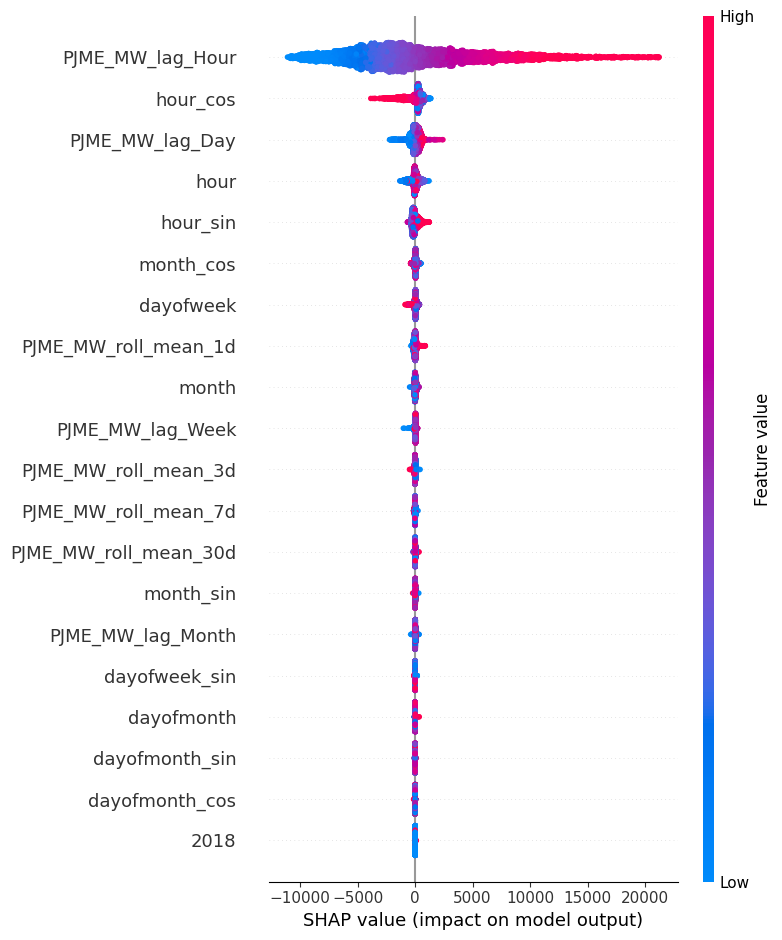

In [26]:
# SHAP explanation for XGBoost
explainer_xgb = shap.Explainer(xgb_model, X_train)
shap_values_xgb = explainer_xgb(X_test)

# SHAP summary plot (Global explanation)
shap.summary_plot(shap_values_xgb, X_test)

* From SHAP summary plot (Global explanation) for XGBoost we can tell that lag_Hour has the most impact on model output. hour_cos and lag_Day are the second and third highest impactful variables for output. Both  lag_Hour and hour_cos variable have a positive impact, i.e. for higher lag_Hour value, the output increases and for lower value, the output decreases. But hour_cos is the opposite. 

PermutationExplainer explainer: 6891it [07:45, 14.76it/s]                          
C:\Users\ronys\AppData\Local\Temp\ipykernel_10820\1989011892.py:6: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(shap_values_nn, X_test_scaled, feature_names=features)


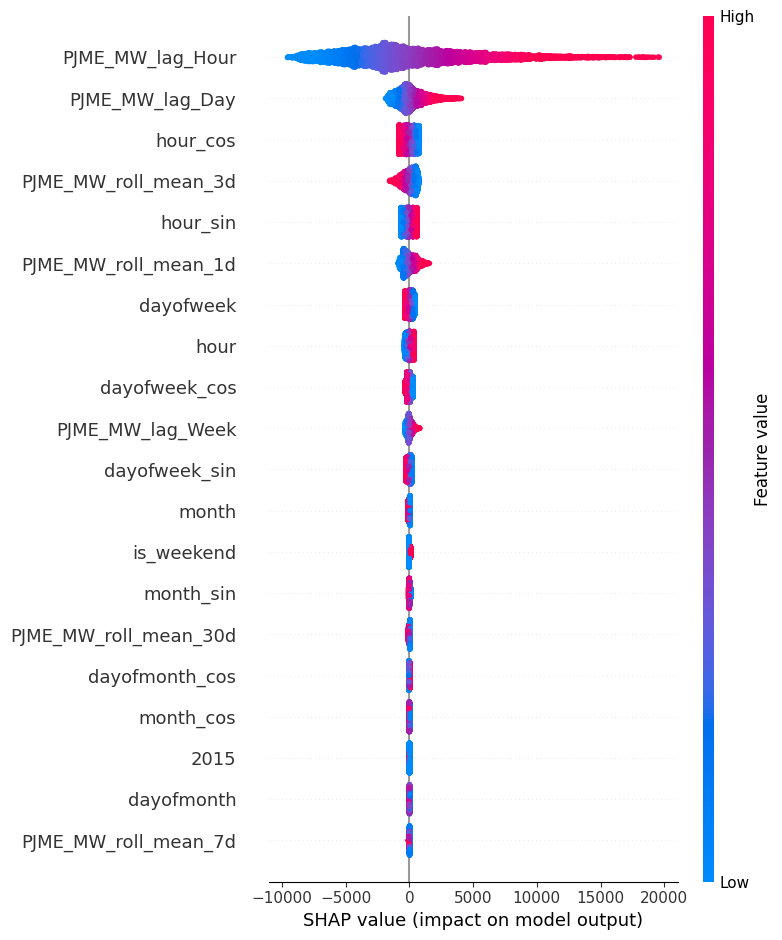

In [27]:
# SHAP explanation for Neural Network
explainer_nn = shap.Explainer(nn_model, X_train_scaled)
shap_values_nn = explainer_nn(X_test_scaled)

# SHAP summary plot for Neural Network
shap.summary_plot(shap_values_nn, X_test_scaled, feature_names=features)



. average prediction = E[f(X)]=32721.6
. Predicted number of rings=f(x)=32438.47
for dayofmonth-F6(value=-0.535) contrebute +66.92 in prediction


* From SHAP summary plot (Global explanation) for Neural Network we have seen a little different value then XGBoost. Here the lag_Hour has the most impact on model output. lag_Day and hour_cos are the second and third highest impactful variables for output. But if we think about the most impactful or the top three impactful variables, then both the models are equal. 

In [34]:
# Evaluate the Model
predictions = nn_model.predict(X_test_scaled)

# Flatten the predictions array
predictions = predictions.flatten()

# Calculate Evaluation Metrics
mae = mean_absolute_error(y_test, predictions)
mse = mean_squared_error(y_test, predictions)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, predictions)
mape = mean_absolute_percentage_error(y_test, predictions)

# Print the Results
print(f"Mean Absolute Error (MAE): {mae:.2f}")
print(f"Mean Squared Error (MSE): {mse:.2f}")
print(f"Root Mean Squared Error (RMSE): {rmse:.2f}")
print(f"R-squared (R2): {r2:.2f}")
print(f"Mean Absolute Percentage Error (MAPE): {mape:.2f}")

216/216 ━━━━━━━━━━━━━━━━━━━━ 0s 765us/step
Mean Absolute Error (MAE): 899.29
Mean Squared Error (MSE): 1486197.25
Root Mean Squared Error (RMSE): 1219.10
R-squared (R2): 0.96
Mean Absolute Percentage Error (MAPE): 0.03


In [28]:
import lime
import lime.lime_tabular

In [29]:
#Convert the data to a dataframe if it is not already
X_test_scaled_df = pd.DataFrame(X_test_scaled, columns=features)
X_train_scaled_df = pd.DataFrame(X_train_scaled, columns=features)

In [30]:
X_test_scaled_df.iloc[0]

hour                     3.043478e-01
dayofweek                5.000000e-01
dayofmonth               6.666667e-01
month                    0.000000e+00
is_weekend               0.000000e+00
hour_sin                 9.829629e-01
hour_cos                 3.705905e-01
dayofweek_sin            7.225209e-01
dayofweek_cos            5.551115e-17
month_sin                7.500000e-01
month_cos                9.330127e-01
dayofmonth_sin           2.185240e-02
dayofmonth_cos           3.454915e-01
PJME_MW_lag_Hour         4.089790e-01
PJME_MW_lag_Day          5.271758e-01
PJME_MW_lag_Week         4.934947e-01
PJME_MW_lag_Month        3.431975e-01
PJME_MW_roll_mean_1d     6.322277e-01
PJME_MW_roll_mean_3d     5.505969e-01
PJME_MW_roll_mean_7d     4.890719e-01
PJME_MW_roll_mean_30d    5.492777e-01
2015                     0.000000e+00
2016                     1.000000e+00
2017                     0.000000e+00
2018                     0.000000e+00
Name: 2016-01-21 07:00:00, dtype: float64

157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 858us/step
For Row: 0
[('PJME_MW_lag_Day > 0.43', 1796.6480783764057), ('PJME_MW_roll_mean_3d > 0.50', -1082.231566218346), ('PJME_MW_roll_mean_1d > 0.51', 1012.6082796893307), ('0.30 < PJME_MW_lag_Hour <= 0.43', 972.8914464429628), ('hour_sin > 0.85', 768.9157355601859), ('PJME_MW_lag_Week > 0.42', 647.544364486738), ('dayofweek_cos <= 0.00', 452.3068187208986)]


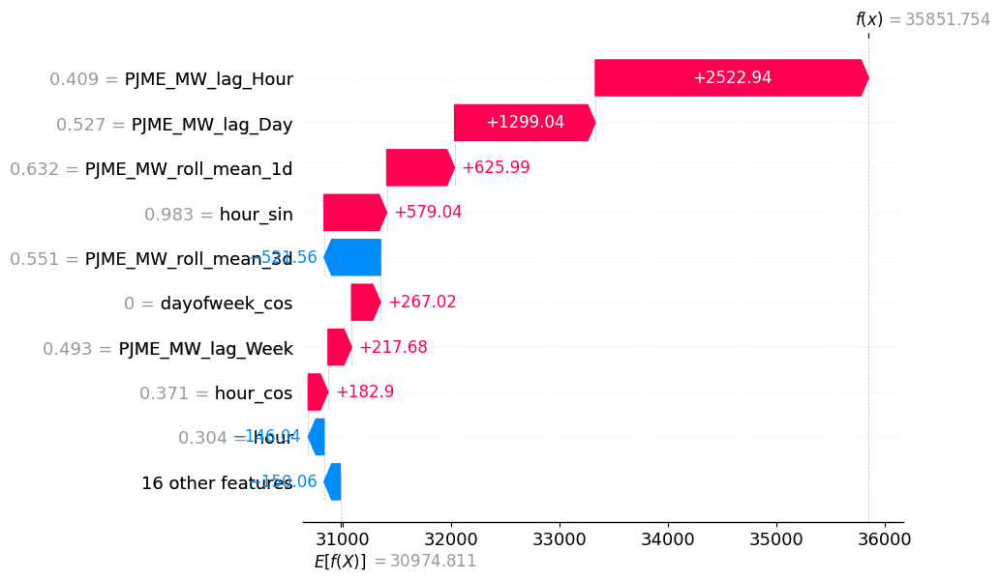

157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 873us/step
For Row: 1
[('0.30 < PJME_MW_lag_Hour <= 0.43', 821.6192488248115), ('PJME_MW_roll_mean_3d <= 0.17', 770.5259731211397), ('PJME_MW_roll_mean_1d <= 0.21', -746.3252750996195), ('0.21 < PJME_MW_lag_Day <= 0.30', -684.4767092651022), ('hour_sin <= 0.15', -433.08721985505724), ('0.13 < dayofmonth_sin <= 0.50', -421.63018983258206), ('dayofweek_cos <= 0.00', 409.4617004412365)]


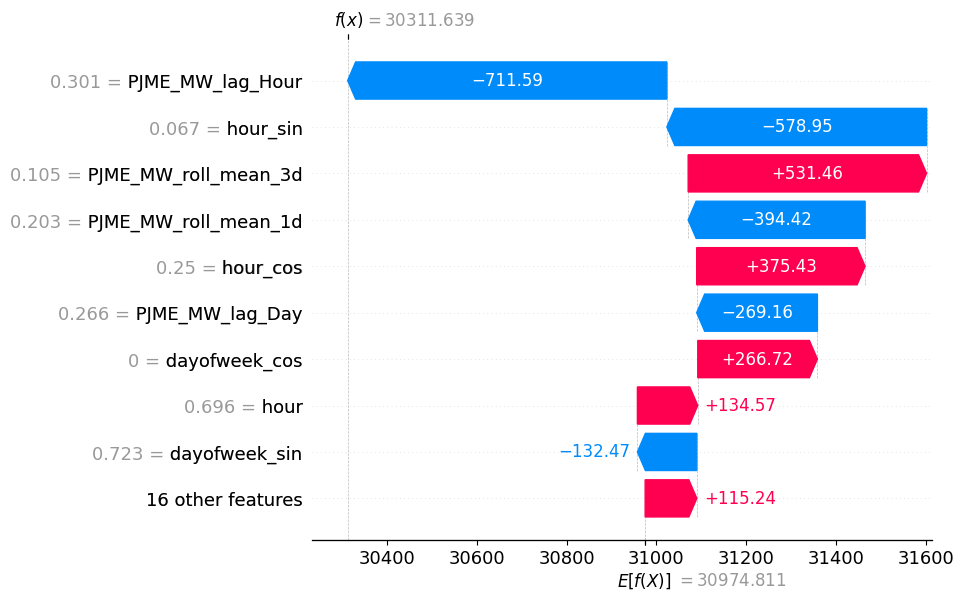

157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 770us/step
For Row: 2
[('PJME_MW_lag_Hour <= 0.21', -8376.505129486975), ('0.21 < PJME_MW_lag_Day <= 0.30', -779.4974117095336), ('hour_cos <= 0.15', 678.1887338485801), ('PJME_MW_lag_Week <= 0.21', -350.07685545982997), ('0.50 < hour_sin <= 0.85', 256.78776311108993), ('dayofweek_sin <= 0.10', 243.6384154686913), ('0.50 < dayofweek <= 0.83', -214.30843593292042)]


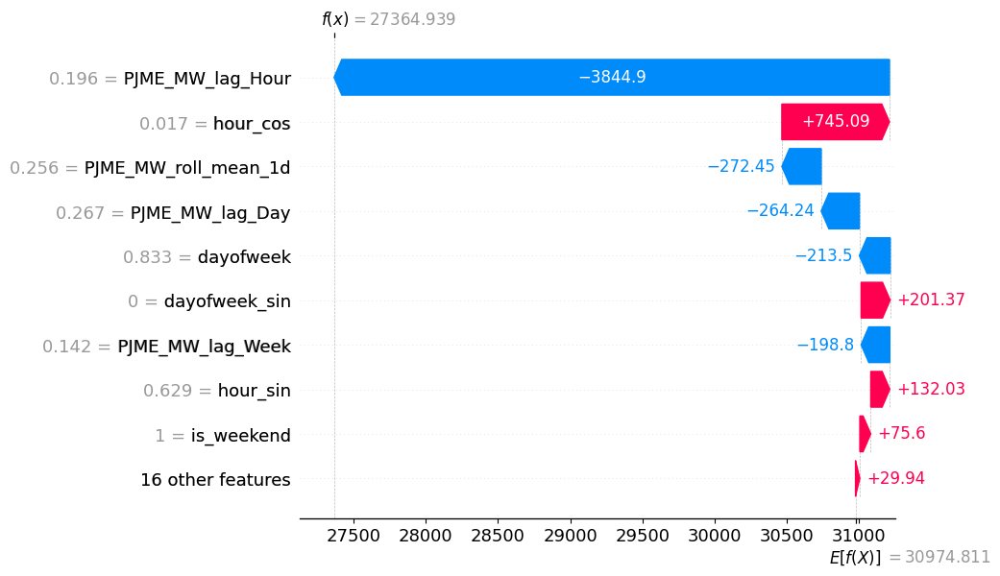

In [31]:

# Create the LIME Explainer for Neural Network
explainer = lime.lime_tabular.LimeTabularExplainer(
    training_data=X_train_scaled_df.values,
    feature_names=features,
    mode='regression'  # Important: Set mode to 'regression'
)
for i in range(3):
    # Choose an Instance to Explain
    instance_index = i
    instance = X_test_scaled_df.iloc[instance_index].values

    # Generate the LIME Explanation
    explanation = explainer.explain_instance(
        data_row=instance,
        predict_fn=nn_model.predict,  # Use model.predict DIRECTLY (NO WRAPPER!)
        num_features=7
    )
    print('For Row: '+str(i))
    # 9. Print and Visualize the Explanation
    print(explanation.as_list())
    shap.plots.waterfall(shap_values_nn[i])#shap 
    explanation.show_in_notebook(show_table=True)#lime
    


[('30383.00 < PJME_MW_lag_Hour <= 35166.00', 848.6327985287412), ('-0.71 < hour_cos <= -0.00', 779.9757530197261), ('PJME_MW_lag_Day > 35179.00', 747.8906142845779), ('6.00 < hour <= 11.00', 591.2822881651239), ('-0.50 < month_sin <= 0.50', 447.3889941269396), ('2017 <= 0.00', -415.91011378331444), ('1.00 < dayofweek <= 3.00', 264.27972487781454)]


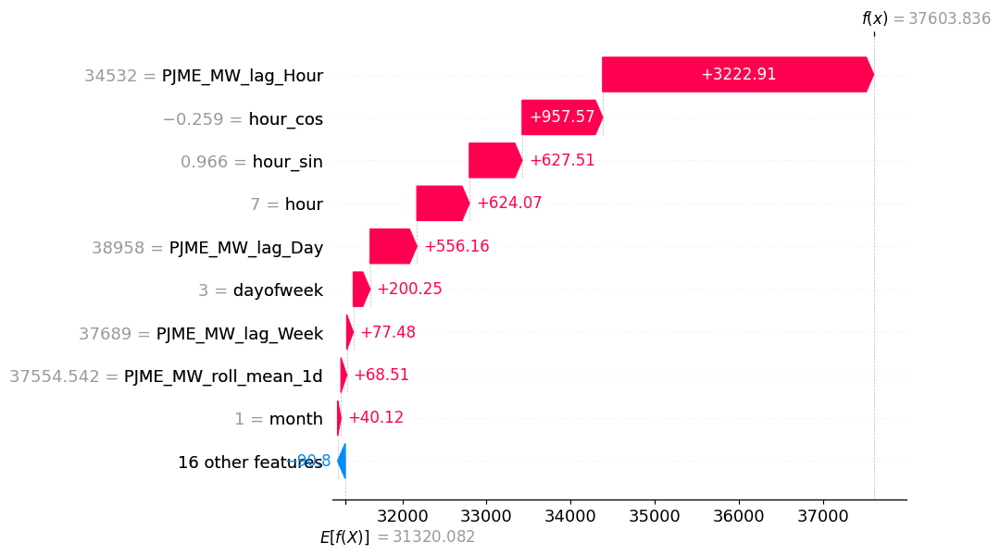

[('30383.00 < PJME_MW_lag_Hour <= 35166.00', 686.9027118457706), ('-0.71 < hour_cos <= -0.00', 454.4564648865872), ('hour_sin <= -0.71', -442.0583356769604), ('11.00 < hour <= 17.00', -365.91007040262076), ('month_sin <= -0.50', -309.95098826219674), ('0.00 < 2016 <= 1.00', 254.60425889487254), ('PJME_MW_roll_mean_1d <= 27625.79', -248.08686781089648)]


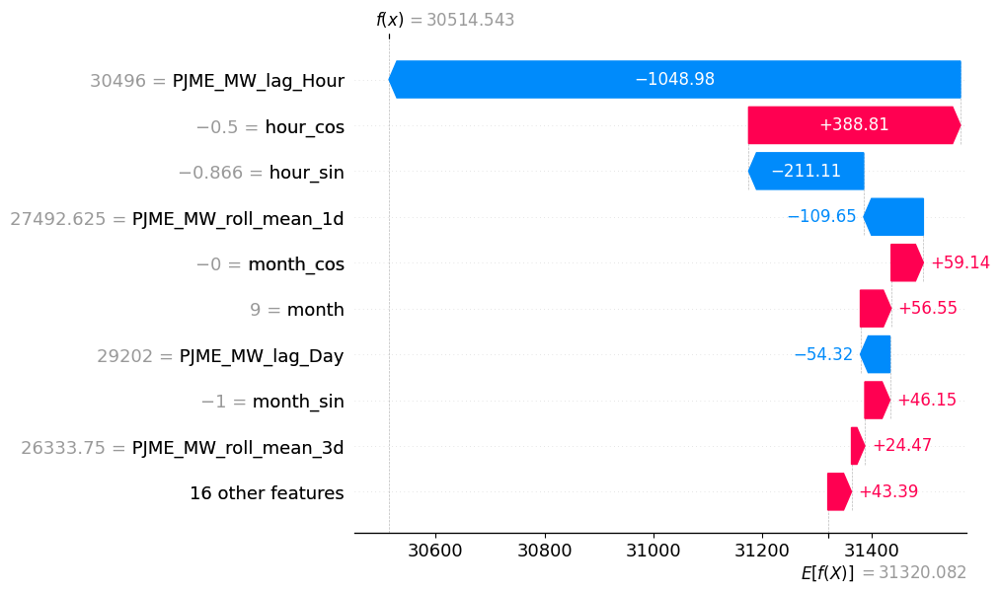

[('PJME_MW_lag_Hour <= 27013.00', -9044.997366063702), ('hour_cos <= -0.71', 788.0388535576518), ('-0.50 < month_sin <= 0.50', 272.3168897294109), ('30815.59 < PJME_MW_roll_mean_30d <= 34193.66', 229.3738319652879), ('2016 <= 0.00', 157.76145803738646), ('dayofweek_sin <= -0.78', 142.05738678327126), ('2018 <= 0.00', -138.05201841664885)]


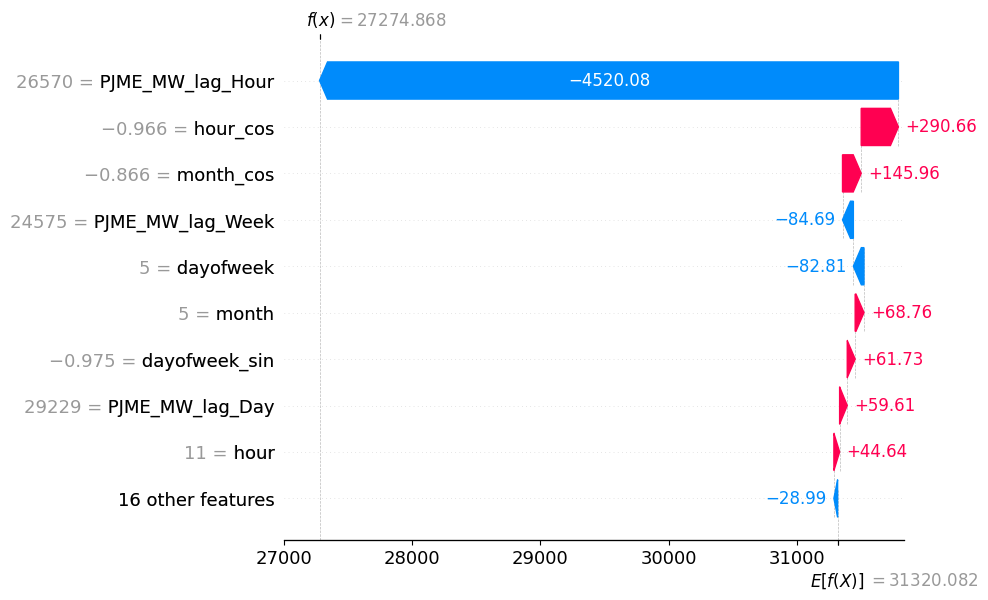

In [32]:
# Create a LIME explainer for xgb
explainer = lime.lime_tabular.LimeTabularExplainer(
    training_data=X_train.values,
    feature_names=features,  # Class names for your target variable
    mode='regression'      # 'classification' or 'regression'
)
for i in range(3):
    # Choose an instance to explain
    instance_index = i  # Explain the instance i in the test set
    instance = X_test.iloc[instance_index]

    # Generate the explanation
    explanation = explainer.explain_instance(
        data_row=instance.values,
        predict_fn=xgb_model.predict,  # Use the wrapper function
        num_features=7  # Show the top 7 features influencing the prediction
    )

    # Print the explanation
    print(explanation.as_list())

    # Visualize the explanation (optional - requires matplotlib)
    shap.plots.waterfall(shap_values_xgb[i])
    explanation.show_in_notebook(show_table=True)